#**Notebook Rodrigo Processamento de imagens:**

Bem-vindo ao nosso notebook introdutório sobre processamento de imagens com diversas bibliotecas, incluindo o OpenCV, Pillow e scikit-image! Estas bibliotecas oferecem uma ampla gama de funcionalidades para manipulação, análise e processamento de imagens em Python. Neste tutorial, exploraremos algumas das funcionalidades básicas dessas bibliotecas, desde a leitura e exibição de imagens até transformações e detecção de recursos. Vamos mergulhar e descobrir como essas bibliotecas podem ser ferramentas poderosas para trabalhar com imagens em projetos de visão computacional e processamento de imagens.

#Introdução ao OpenCV

In [1]:
import cv2

print("OpenCV Version:", cv2.__version__)

OpenCV Version: 4.8.0


Por favor, faça o upload de uma imagem:


Saving style_image_1_resized.jpg to style_image_1_resized.jpg
Imagem carregada com sucesso!


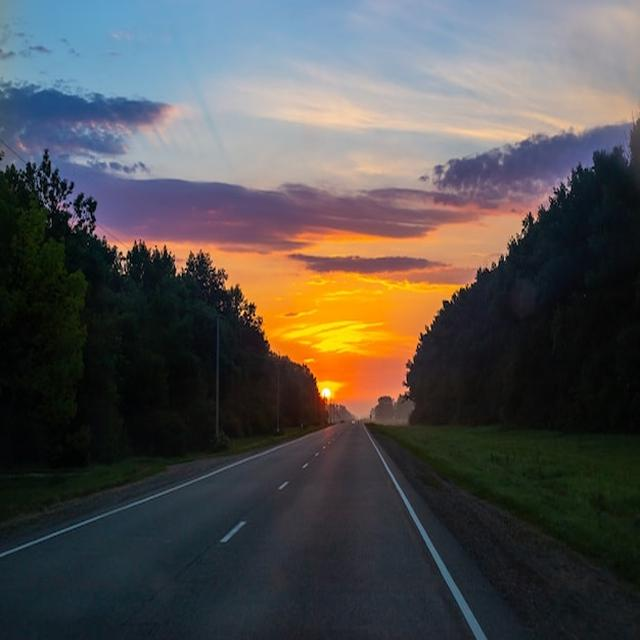

In [2]:
# Importar bibliotecas necessárias
from google.colab import files
import cv2
from google.colab.patches import cv2_imshow
import numpy as np


# Solicitar ao usuário que faça o upload de um arquivo de imagem
print("Por favor, faça o upload de uma imagem:")
uploaded = files.upload()

# Verificar se pelo menos um arquivo foi enviado
if len(uploaded.keys()) > 0:
    # Obter o nome do arquivo enviado
    file_name = list(uploaded.keys())[0]

    # Carregar a imagem usando o OpenCV
    image = cv2.imdecode(
        np.frombuffer(uploaded[file_name], np.uint8),
        cv2.IMREAD_COLOR
    )

    # Verificar se a imagem foi carregada corretamente
    if image is not None:
        print("Imagem carregada com sucesso!")
        # Exibir a imagem carregada
        cv2_imshow(image)
    else:
        print("Não foi possível carregar a imagem.")
else:
    print("Nenhum arquivo foi enviado.")


##Ler, escrever e exibir imagens

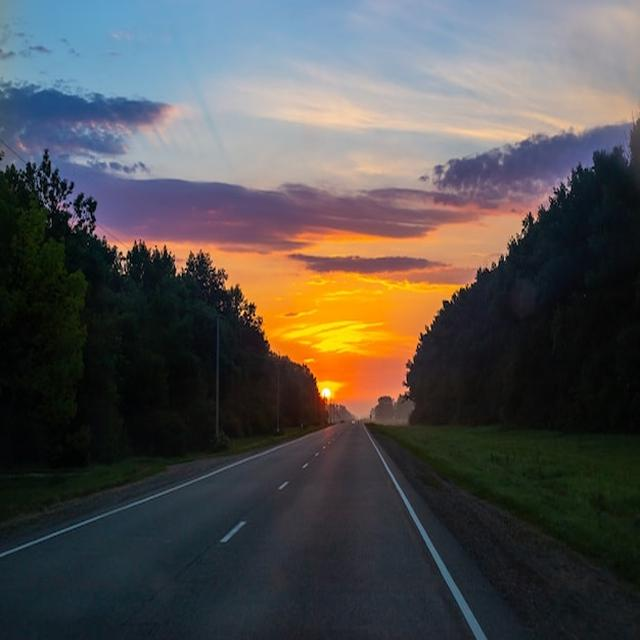

True

In [5]:
import cv2

# Ler imagem
img = image

# Exibir imagem
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Salvar imagem
cv2.imwrite('output.jpg', img)

##Transformações de imagem (redimensionar, girar, inverter)

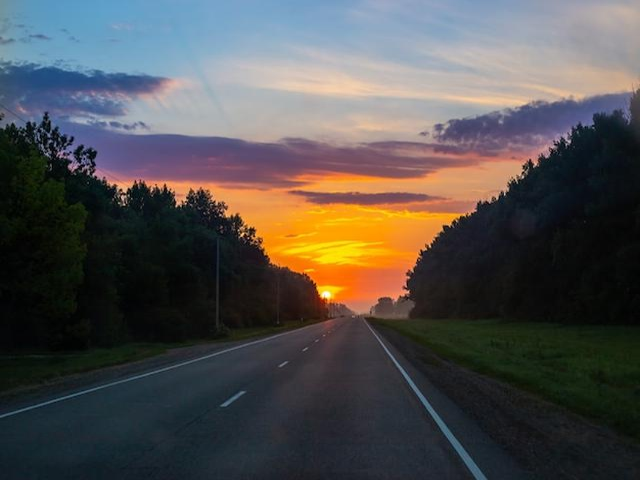

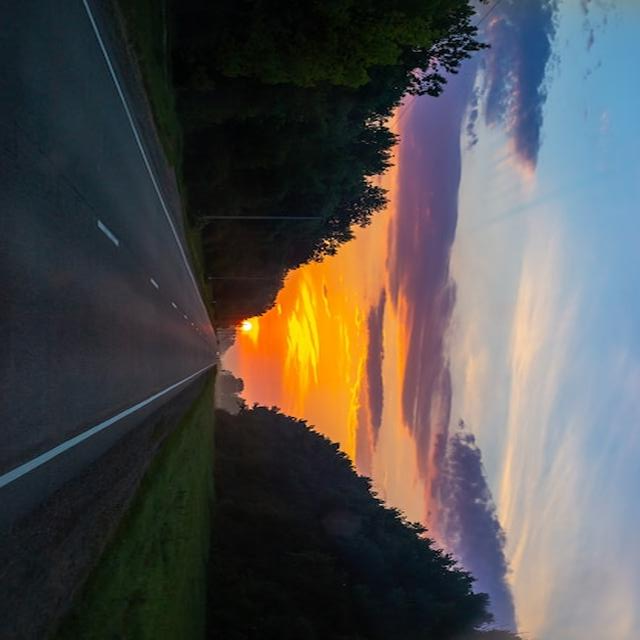

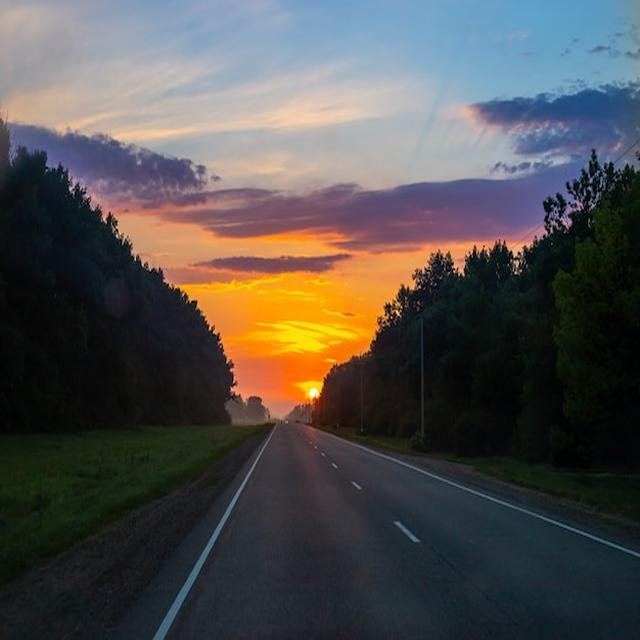

In [6]:
import cv2

img = image

# Redimensionar imagem
resized_img = cv2.resize(img, (640, 480))
cv2_imshow(resized_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Rotacionar imagem
rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
cv2_imshow(rotated_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Flip imagem
flipped_img = cv2.flip(img, 1)
cv2_imshow(flipped_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

##Filtros de imagem (desfoque gaussiano, filtro mediano, filtro bilateral)

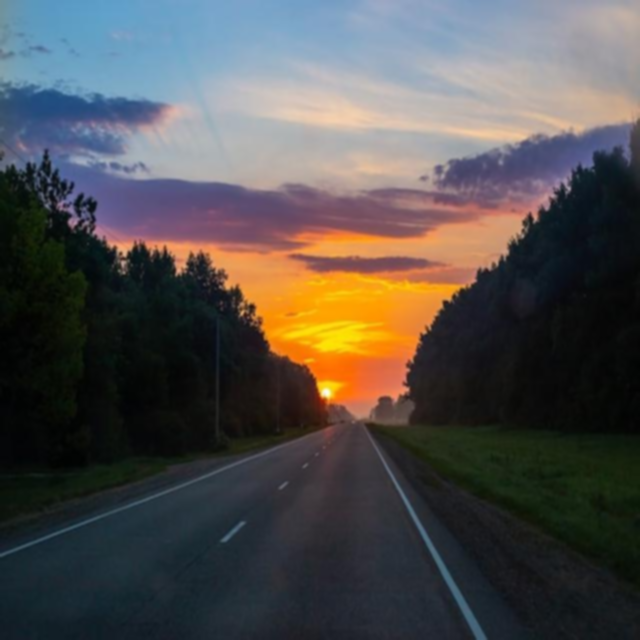

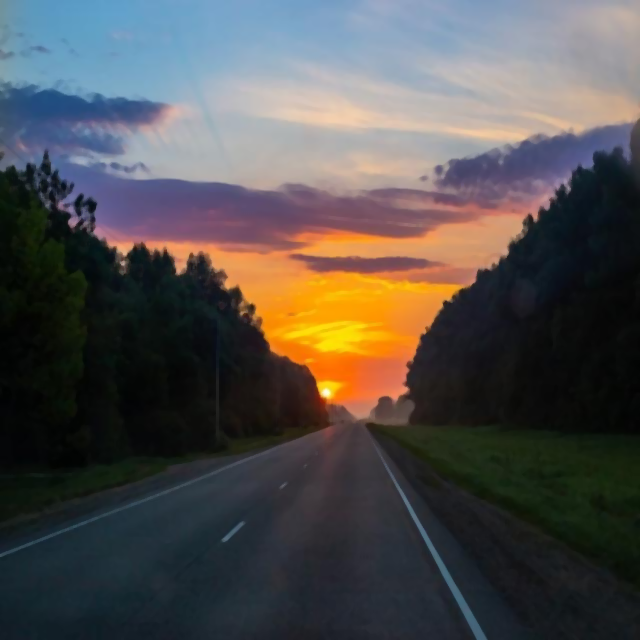

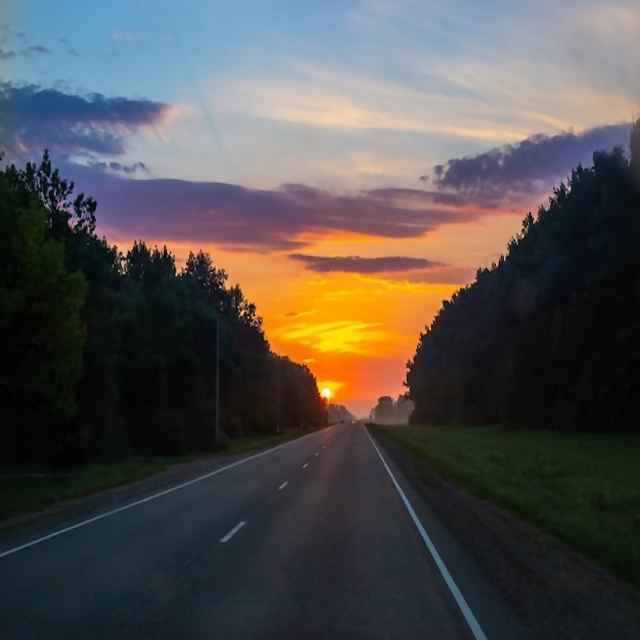

In [8]:
import cv2

img = image

# Filtro Gaussiano
gaussian_blur_img = cv2.GaussianBlur(img, (5, 5), 0)
cv2_imshow(gaussian_blur_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Filtro Mediano
median_filter_img = cv2.medianBlur(img, 5)
cv2_imshow(median_filter_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Filtro Bilateral
bilateral_filter_img = cv2.bilateralFilter(img, 5, 50, 50)
cv2_imshow(bilateral_filter_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

##Image thresholding

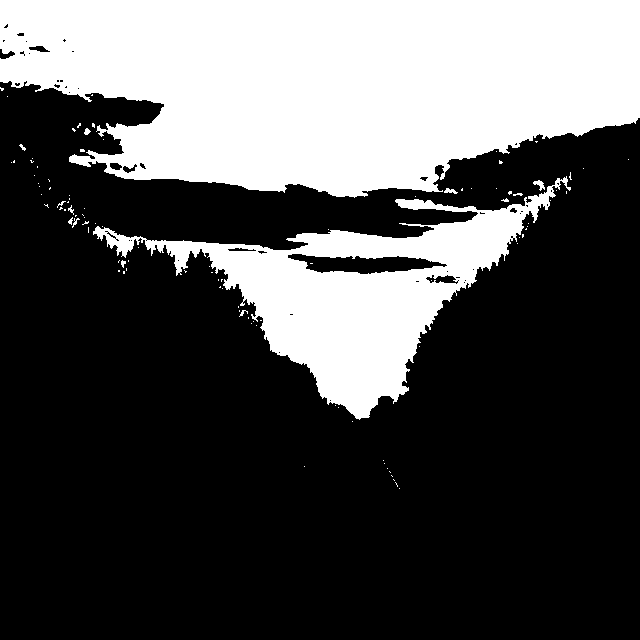

In [12]:
import cv2

# Converter a imagem para tons de cinza
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Thresholding
_, thresh_img = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

# Exibir a imagem thresholded
cv2_imshow(thresh_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

##Corner detection (Harris, FAST)

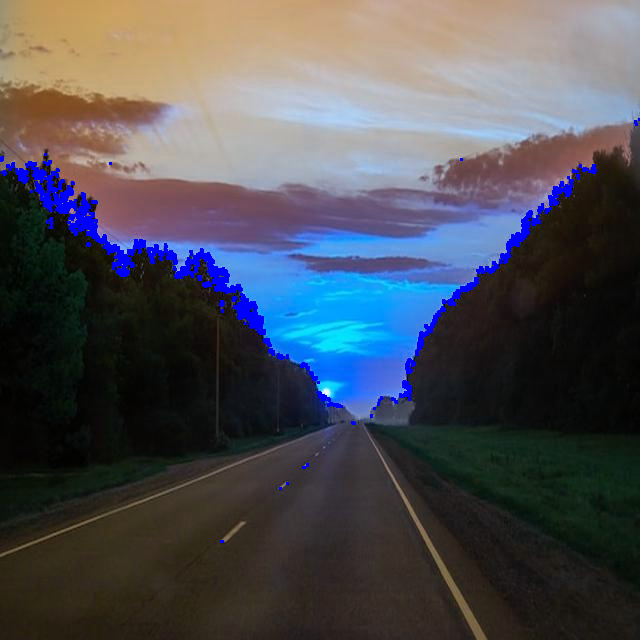

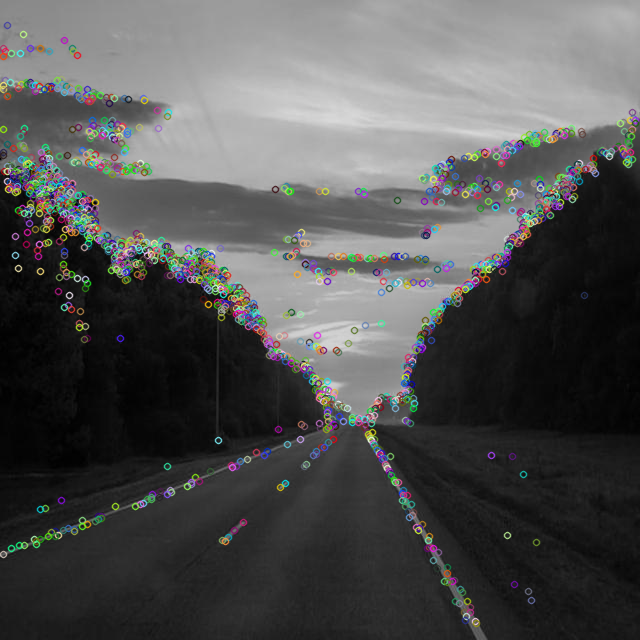

In [18]:
# Carregar a imagem
img = image

# Converter a imagem para escala de cinza
gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Verificar se a conversão foi bem sucedida
if gray_image is not None:
    # Detector de cantos Harris
    dst = cv2.cornerHarris(gray_image, 2, 3, 0.04)
    dst = cv2.dilate(dst, None)
    img_with_harris_corners = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_with_harris_corners[dst > 0.01 * dst.max()] = [255, 0, 0]
    cv2_imshow(img_with_harris_corners)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    # Detector de cantos FAST
    fast = cv2.FastFeatureDetector_create()
    fast_corners = fast.detect(gray_image)
    img_with_fast_corners = cv2.drawKeypoints(gray_image, fast_corners, None)
    cv2_imshow(img_with_fast_corners)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
else:
    print("Não foi possível converter a imagem para tons de cinza.")


##Scale-invariant feature transform (SIFT)

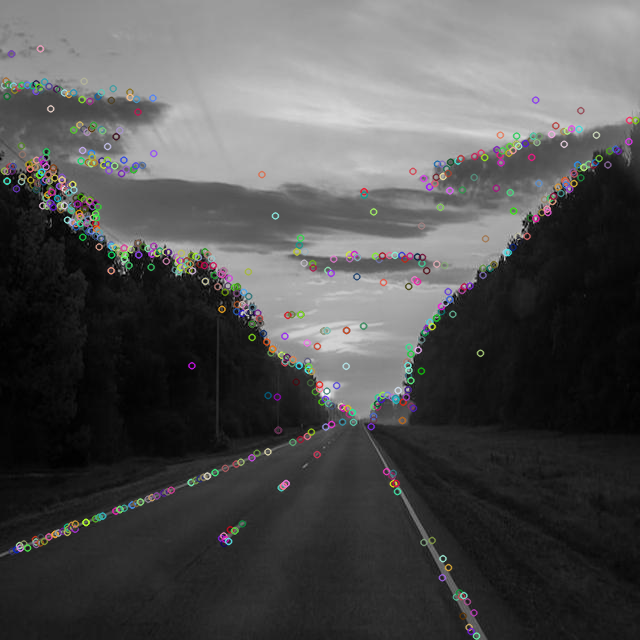

In [20]:
import cv2

img = gray_image

# Detector de características SIFT
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(img, None)
cv2_imshow(cv2.drawKeypoints(img, kp, None))
cv2.waitKey(0)
cv2.destroyAllWindows()

##Oriented FAST and rotated BRIEF (ORB)

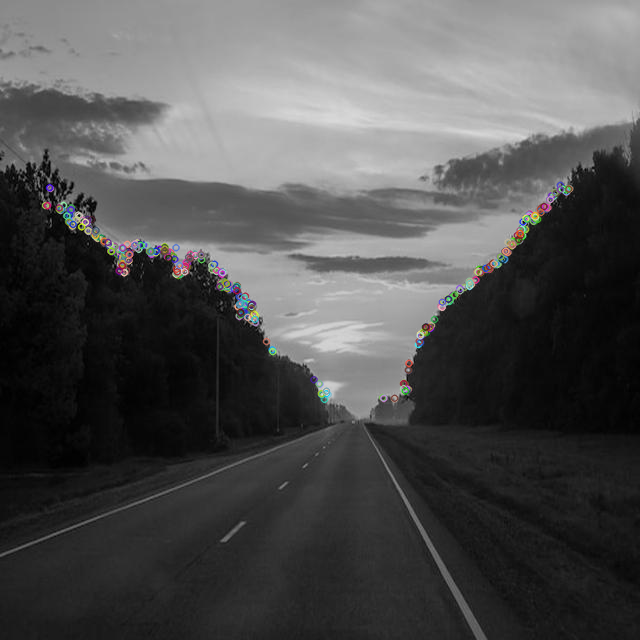

In [23]:
img = gray_image

# Detector de características ORB
orb = cv2.ORB_create()
kp, des = orb.detectAndCompute(img, None)
cv2_imshow(cv2.drawKeypoints(img, kp, None))
cv2.waitKey(0)
cv2.destroyAllWindows()

##Correspondência de imagens e detecção de objetos

##Brute-forcematcher

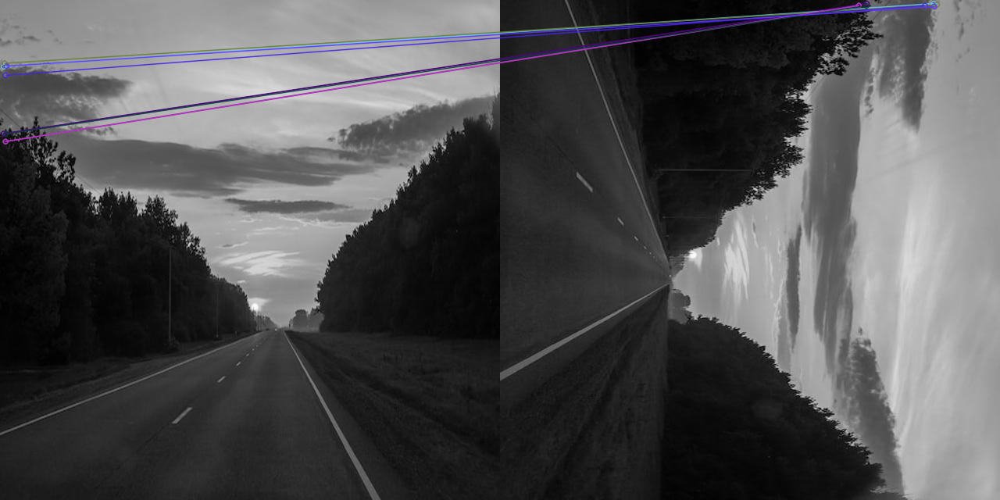

In [25]:
import cv2

img1 = gray_image
img2 = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)

# Detector de características SIFT
sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

bf = cv2.BFMatcher()
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

result = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)
cv2_imshow(result)
cv2.waitKey(0)
cv2.destroyAllWindows()

##FLANN-based matcher

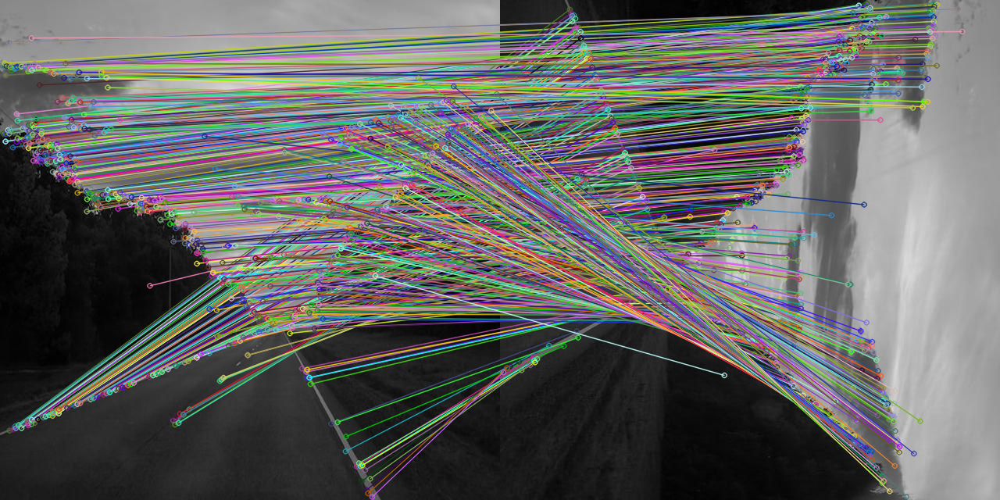

In [32]:
# Supondo que você já tenha as imagens img1 e img2
img1 = gray_image
img2 = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)

# Detector de características SIFT
sift = cv2.SIFT_create()

# Encontrar keypoints e descritores para ambas as imagens
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Matcher FLANN
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)

# Selecionar bons matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# Desenhar os matches
result = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [good_matches], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(result)
cv2.waitKey(0)
cv2.destroyAllWindows()

##Homography matrix estimation

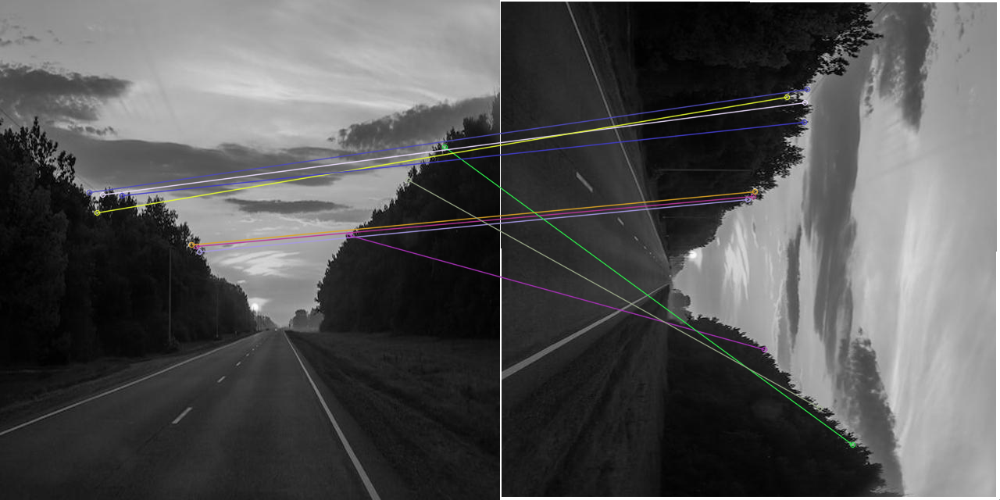

In [35]:
# Detector de características ORB
orb = cv2.ORB_create()

# Encontrar keypoints e descritores para ambas as imagens
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Matcher de força bruta
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Encontrar correspondências
matches = bf.match(des1, des2)

# Classificar as correspondências com base na distância
matches = sorted(matches, key=lambda x: x.distance)

# Desenhar correspondências
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Exibir as correspondências
cv2_imshow(img_matches)
cv2.waitKey(0)
cv2.destroyAllWindows()

#Introdução ao Pillow:

##Primeiro, você precisa importar o Pillow e outras bibliotecas necessárias:

In [37]:
from PIL import Image
import matplotlib.pyplot as plt

##Em seguida, você pode carregar uma imagem usando o Pillow:

In [38]:
# Fazer upload de uma imagem
uploaded = files.upload()
# Obter o nome do arquivo da imagem carregada
image_path = list(uploaded.keys())[0]
# Carregar a imagem usando o Pillow
image = Image.open(image_path)

Saving Coral-Sol-1-1.jpg to Coral-Sol-1-1.jpg


##Agora, vamos explorar algumas funcionalidades básicas do Pillow:

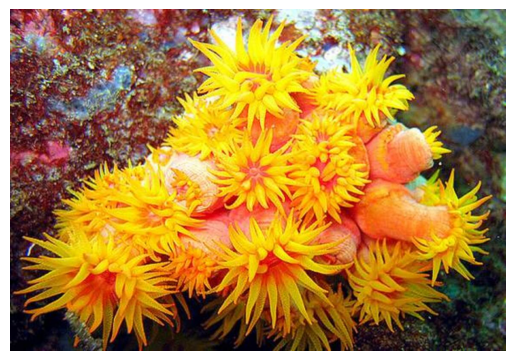

In [41]:
# Exibir a imagem
plt.imshow(image)
plt.axis('off')
plt.show()


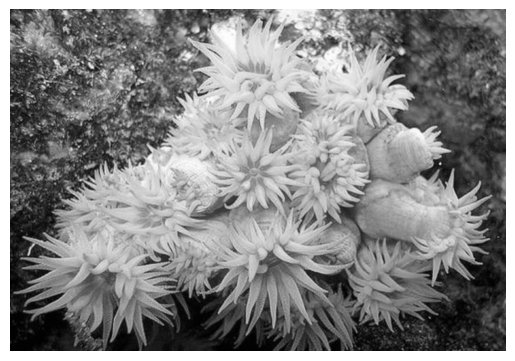

In [42]:
# Converter a imagem para escala de cinza
gray_image = image.convert('L')
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.show()


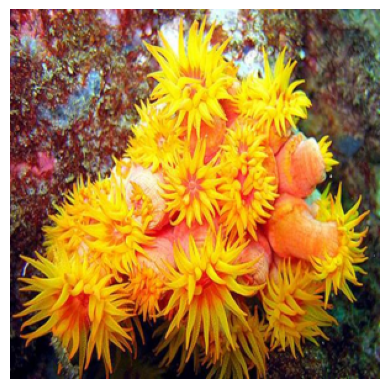

In [43]:
# Redimensionar a imagem
resized_image = image.resize((300, 300))
plt.imshow(resized_image)
plt.axis('off')
plt.show()

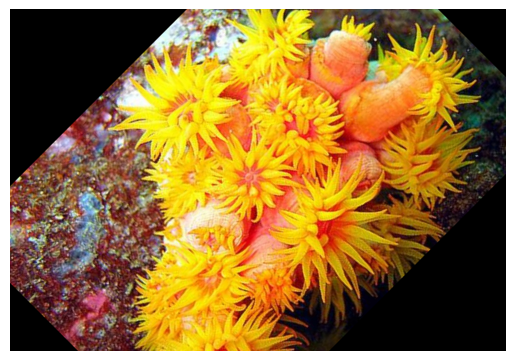

In [44]:
# Girar a imagem
rotated_image = image.rotate(45)
plt.imshow(rotated_image)
plt.axis('off')
plt.show()


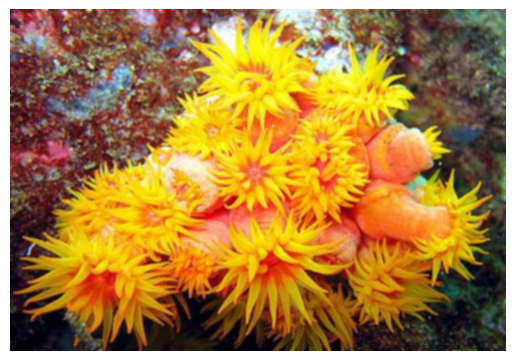

In [45]:
# Aplicar filtro
from PIL import ImageFilter
filtered_image = image.filter(ImageFilter.BLUR)
plt.imshow(filtered_image)
plt.axis('off')
plt.show()

#Introdução ao Scikit-image (SciPy Imaging):

##Primeiro, você precisa importar o scikit-image e outras bibliotecas necessárias:

In [40]:
from skimage import io, color, filters, transform
import matplotlib.pyplot as plt

##Em seguida, você pode carregar uma imagem usando o scikit-image:

In [46]:
# Fazer upload de uma imagem
uploaded = files.upload()
# Obter o nome do arquivo da imagem carregada
image_path = list(uploaded.keys())[0]
image = io.imread(image_path)

Saving create_a_landscape_with_a_house_near_a_lighthous.jpg to create_a_landscape_with_a_house_near_a_lighthous.jpg


##Agora, vamos explorar algumas funcionalidades básicas do scikit-image:

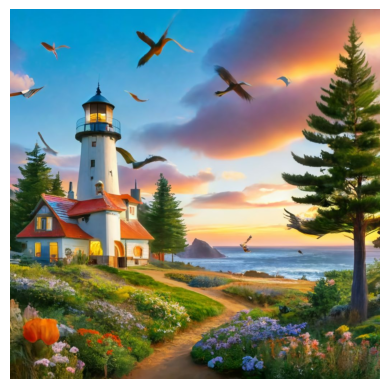

In [47]:
# Exibir a imagem
plt.imshow(image)
plt.axis('off')
plt.show()

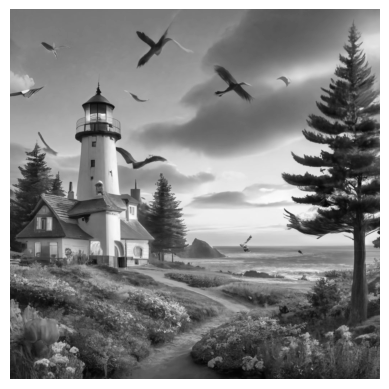

In [48]:
# Converter a imagem para escala de cinza
gray_image = color.rgb2gray(image)
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.show()

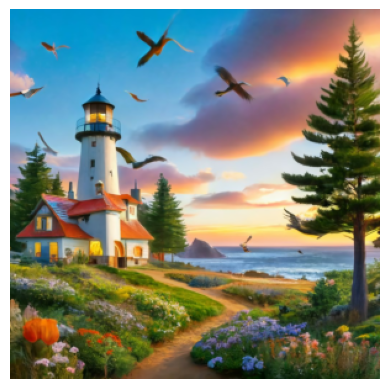

In [50]:
# Redimensionar a imagem
resized_image = transform.resize(image, (300, 300))
plt.imshow(resized_image)
plt.axis('off')
plt.show()

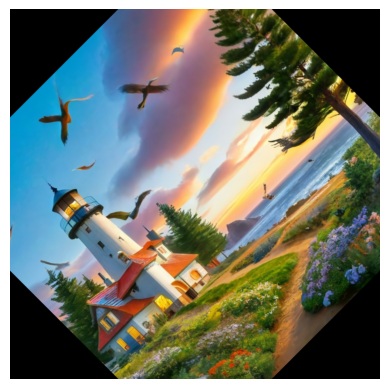

In [51]:
# Rotação da imagem
rotated_image = transform.rotate(image, 45)
plt.imshow(rotated_image)
plt.axis('off')
plt.show()

#**Conclusão:**

Neste notebook, demos os primeiros passos no mundo do processamento de imagens com o OpenCV, Pillow e scikit-image. Aprendemos a ler, exibir e manipular imagens, realizar transformações básicas como redimensionamento e rotação, aplicar filtros para melhorar a qualidade da imagem, e até mesmo detectar características importantes, como cantos e objetos. Essas são apenas algumas das muitas funcionalidades que essas bibliotecas oferecem para processamento de imagens. Com prática e exploração adicional, você poderá dominar ainda mais esses poderosos conjuntos de ferramentas e aplicá-los em uma ampla variedade de projetos e aplicações. Esperamos que este notebook tenha sido útil e inspirador para suas futuras aventuras em processamento de imagens com o OpenCV, Pillow e scikit-image!